# Historical Laser-Injection Validation Milestones (June 2026)

> **Status:** retained as the exploratory predecessor to the July campaign
> suite. For the current injector and LASY-exporter claims, use
> [`../results_summary.ipynb`](../results_summary.ipynb), which consolidates
> Campaigns A, B, and C with their final metrics and caveats.

This notebook collects figures and metrics from three earlier high-resolution
Viking tests. They established the initial numerical-injection baseline and
LASY amplitude/phase experiment, but they do not supersede the later campaign
results.

In [1]:
from IPython.display import Image, display, Markdown
import os

# Per-test figure directories
BASE = os.path.dirname(os.path.abspath('__file__'))
T1_FIG = os.path.join(BASE, 'test1_gaussian_2d', 'figures')
T2_FIG = os.path.join(BASE, 'test2_lasy_2x2', 'figures')
T3_FIG = os.path.join(BASE, 'test3_gaussian_3d', 'figures')

def show(fig_dir, filename, width=None):
    """Display a PNG from the given figures directory."""
    path = os.path.join(fig_dir, filename)
    if os.path.exists(path):
        display(Image(filename=path, width=width))
    else:
        print(f'[missing: {filename} in {fig_dir}]')

---
## Test 1 — 2D Gaussian beam, profile-only comparison

**What:** the analytical run uses EPOCH's native `gauss(y, 0, w_bnd)` spatial
profile with an analytical temporal envelope; the numerical run injects the
identical Gaussian envelope from a `.dat` file via the custom injector. Both
share the **same analytical paraxial phase**, so any difference isolates the
injection path (file I/O + bilinear interpolation), not the physics. Note that for this beam waist, the paraxial approximation breaks down. 

**Beam:** λ₀ = 1 µm, pulse FWHM = 2 µm (w₀ ≈ 1.2 µm), focus 10 µm
downstream of the x_min boundary.  
**Resolution:** 50 cells/λ (nx = 1750, ny = 1250).  
**Box:** x ∈ [−20, 15] µm, y ∈ [−12.5, 12.5] µm, t_end = 200 fs.

### Headline metrics

| Metric | Value |
|--------|-------|
| Peak \|E_y\| | 53.81 a₀ |
| Max \|difference\| | 1.00 × 10⁻³ a₀ (0.0019% of peak) |
| Max relative difference | **0.011%** |
| Mean relative difference | 0.0023% |

The injector reproduces the native analytical Gaussian to the **discretisation
floor** — well under 0.02%. The residual concentrates at beam edges where the
amplitude gradient is steepest and bilinear interpolation is least accurate.

### Field triptychs (analytical | numerical | difference)

Selected snapshots showing the full 2D E_y field. The difference panel (right)
has its own colour scale — note the ~10⁻⁴ a₀ range vs the ~50 a₀ field.

**Snapshot t05**

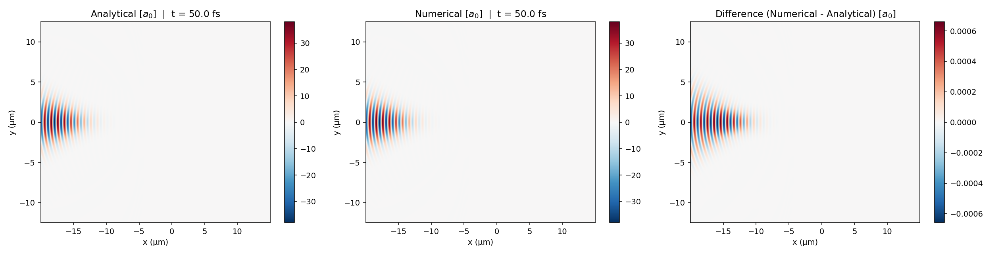

**Snapshot t10**

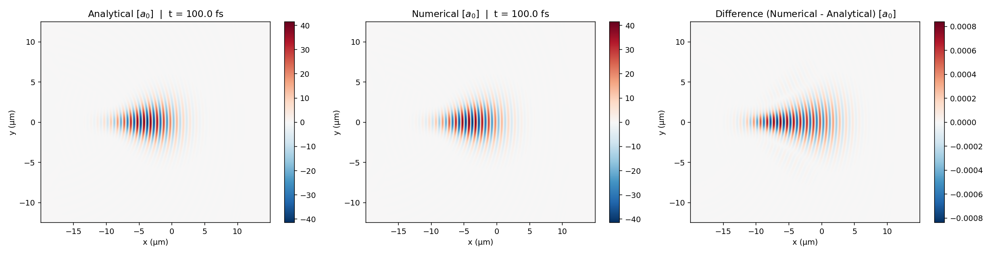

**Snapshot t15**

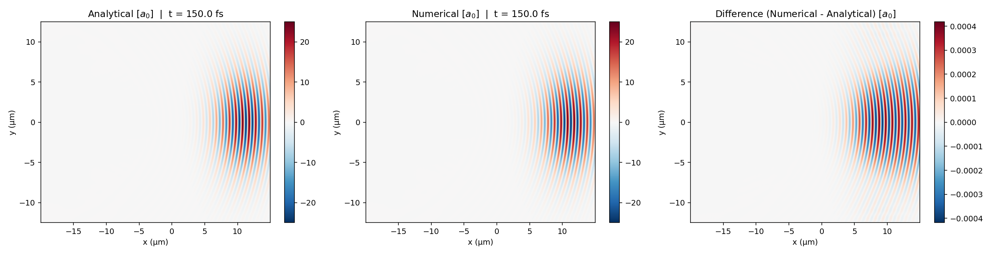

**Snapshot t20**

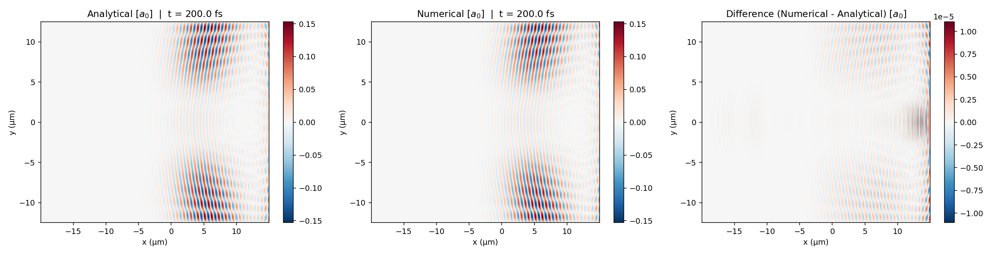

In [18]:
for idx in [ '05', '10', '15', '20']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T1_FIG, f'field_t{idx}.png')

### Relative difference maps

Left: reference Hilbert envelope (amplitude modulation). Right: pointwise
relative difference (\|diff\| / envelope), masked outside the 1% beam core.
The relative error is spatially uniform in the core and rises at the edges.

Note that there are numerical defect at t=50fs and 150fs. As of now I cannot figure out why,

**Snapshot t05**

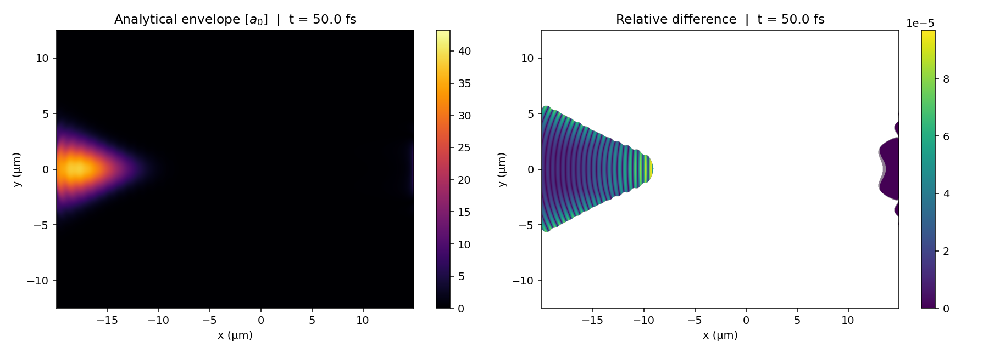

**Snapshot t10**

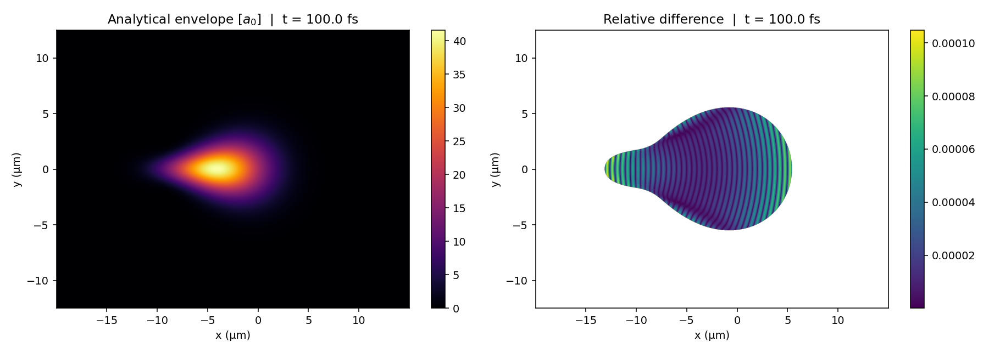

**Snapshot t15**

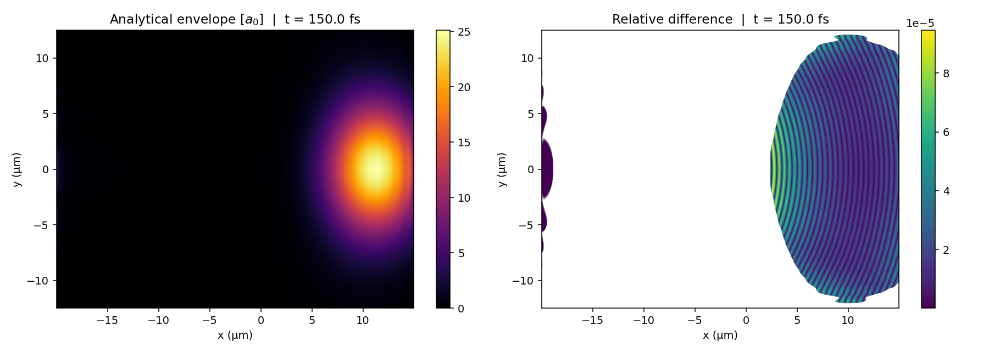

**Snapshot t20**

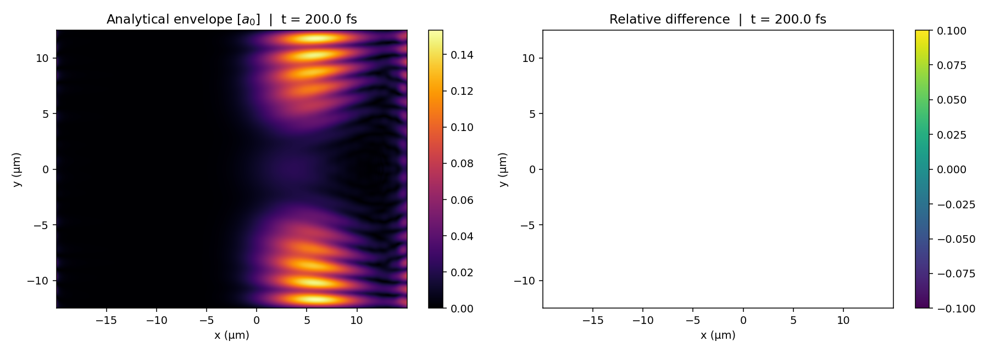

In [19]:
for idx in [ '05', '10', '15', '20']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T1_FIG, f'reldiff_t{idx}.png')

### On-axis line-outs (y = 0)

Upper panel: analytical (blue) and numerical (red dashed) E_y along the
propagation axis. Lower panel: residual (numerical − analytical). The two
curves overlay almost perfectly; the residual is O(10⁻⁴) a₀.

**Snapshot t00**

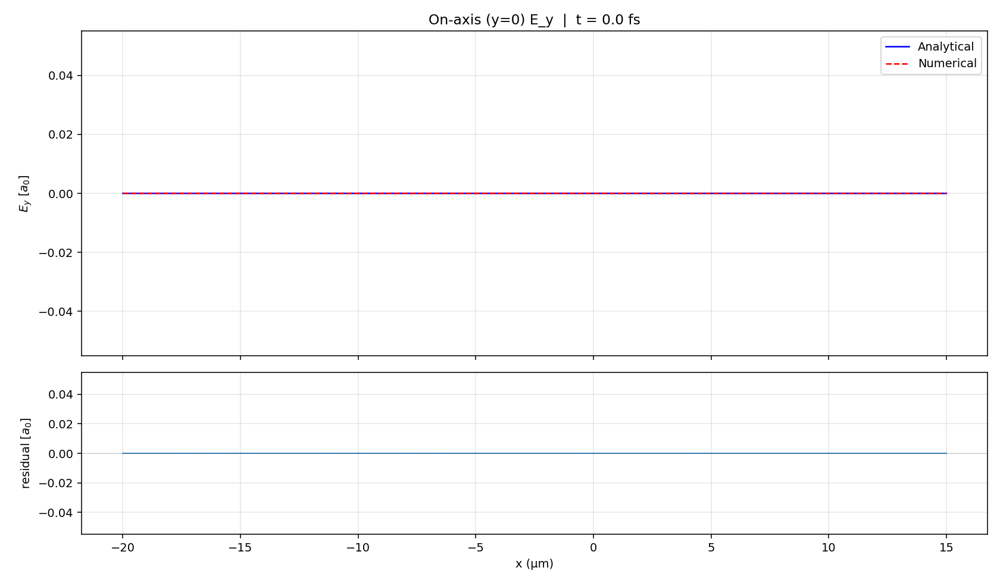

**Snapshot t05**

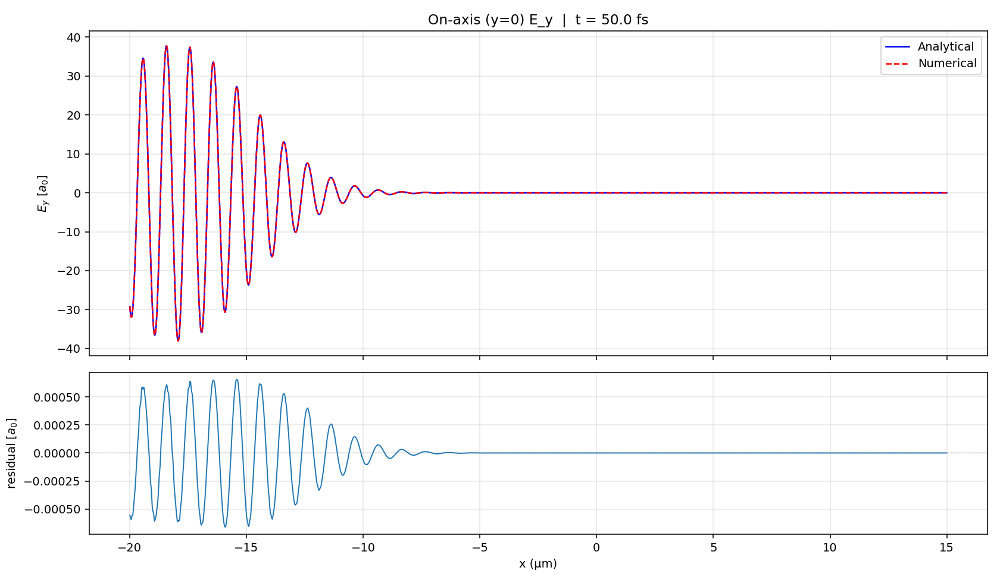

**Snapshot t10**

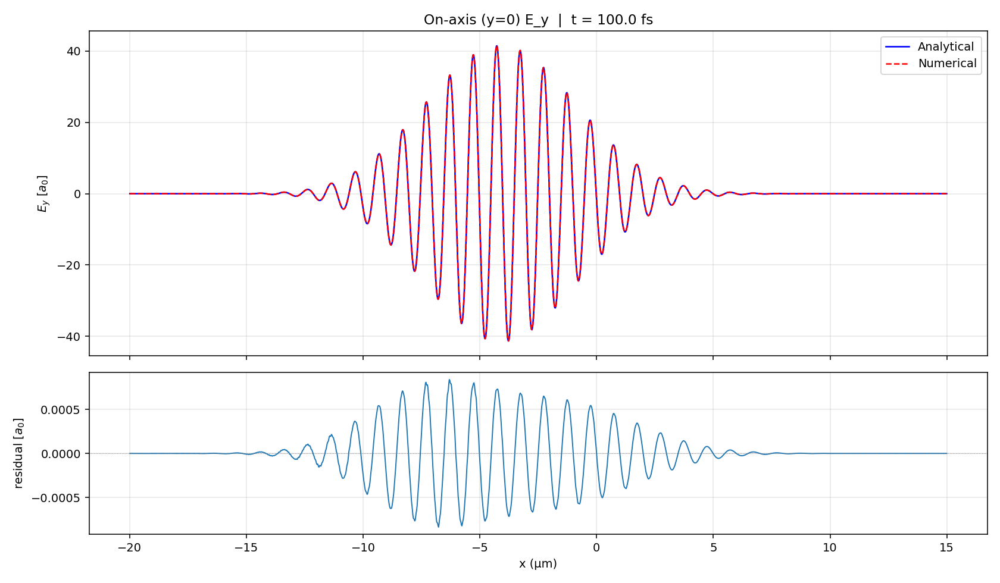

**Snapshot t15**

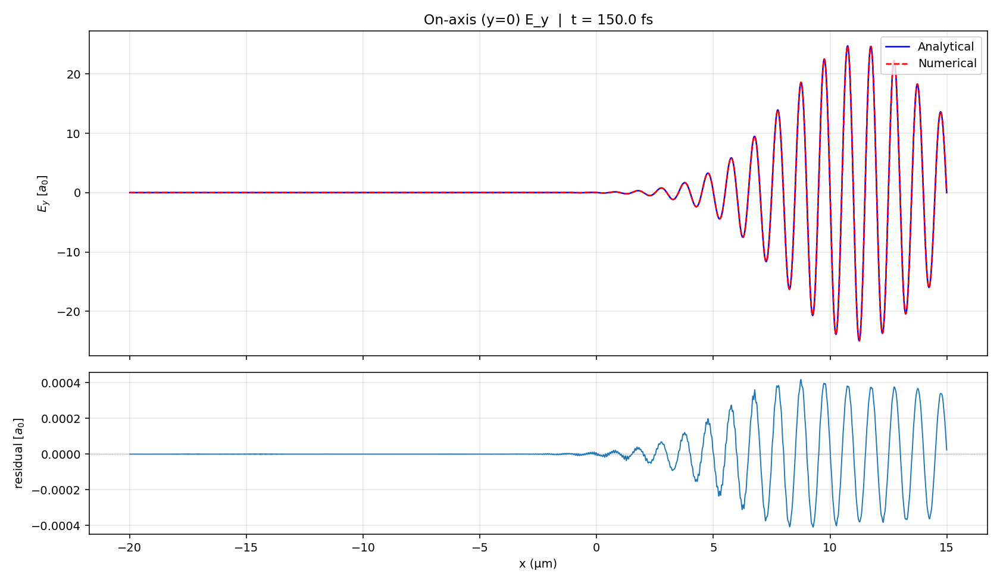

**Snapshot t20**

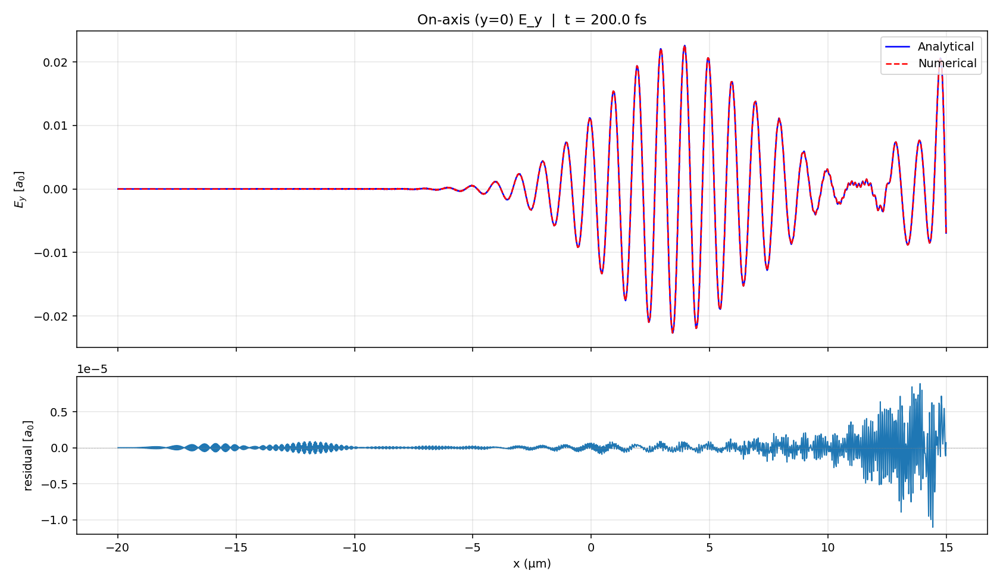

In [4]:
for idx in ['00', '05', '10', '15', '20']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T1_FIG, f'lineout_y0_t{idx}.png')

### Per-snapshot metrics

In [5]:
import pandas as pd

df1 = pd.read_csv(os.path.join(BASE, 'test1_gaussian_2d', 'metrics.csv'))
df1

,time_fs,max_abs_a0,max_abs_pct_peak,max_rel_pct
0,0.02,0.000000,0.00000,NaN
1,10.02,0.000021,0.00004,0.01879
2,20.04,0.000181,0.00034,0.01453
3,30.02,0.000472,0.00088,0.01158
4,40.04,0.000603,0.00112,0.01052
5,50.01,0.000660,0.00123,0.01053
6,60.03,0.000802,0.00149,0.00980
7,70.01,0.000939,0.00174,0.01017
8,80.03,0.001001,0.00186,0.01020
9,90.01,0.000996,0.00185,0.01003


The max absolute difference grows as the pulse enters the box, peaks around
80 fs (pulse fully inside), then decays. The max relative difference stays
steady at ~0.01% throughout propagation — except the last two snapshots where
the pulse has mostly left the box and the denominator (envelope) is small,
inflating the ratio. This is an artefact, not a real accuracy issue.

**Test 1 conclusion:** the custom `.dat` amplitude injector is validated —
it reproduces EPOCH's built-in Gaussian to < 0.02% relative difference.

We remark that the phase in this test is specified by an analytical expression for both simulations. 

---
## Test 2 — LASY 2×2 controlled experiment

**Context:** This project integrates [LASY](https://github.com/LASY-org/lasy) with the custom EPOCH injector. The earlier amplitude-only comparison established a roughly 0.01% injection floor. This controlled experiment varies the amplitude and phase sources separately; because LASY propagation and the paraxial Gaussian are physically different source models, it distinguishes those model differences from file-delivery error.

**What:** a controlled 2×2 experiment (amplitude source × phase source) that
isolates whether the LASY-vs-numerical error comes from the **amplitude** or
the **phase**. We use the numerical run as the reference. Note that the maximum different between analytical and numerical runs is about 0.01%. Five runs share the same beam parameters:

| Run | Amplitude source | Phase source | Role |
|-----|-----------------|--------------|------|
| `analytical` | deck `gauss()` | deck formula | Sanity baseline |
| `numerical` (**REF**) | analytical `.dat` | deck formula | Reference |
| `lasy_amp_deck_phase` | LASY `.dat` | deck formula | Isolate amplitude |
| `numerical_amp_lasy_phase` | analytical `.dat` | LASY `.dat` | Isolate phase |
| `lasy` | LASY `.dat` | LASY `.dat` | Full LASY |

**Beam:** λ₀ = 1 µm, pulse FWHM = 10 µm (w₀ ≈ 6 µm), focus 10 µm downstream.
This is deliberately a wide beam where paraxial is accurate — the test targets
the *injection pipeline*, not the physics.  
**Resolution:** 40 cells/λ (nx = 2800, ny = 2000).  
**Box:** x ∈ [−40, 30] µm, y ∈ [−25, 25] µm, t_end = 250 fs.

### Input comparison (before EPOCH)

First, compare the `.dat` files themselves — the LASY-generated amplitude and
phase vs the analytical equivalents — to see what goes *into* EPOCH.

**Amplitude:** LASY vs analytical normalised envelope. The difference (right
panel) shows a quadrupolar pattern at the ~0.2% level — the physical signature
of LASY's angular-spectrum propagation vs the paraxial formula. Largest at the
beam edges where the paraxial approximation is least accurate.

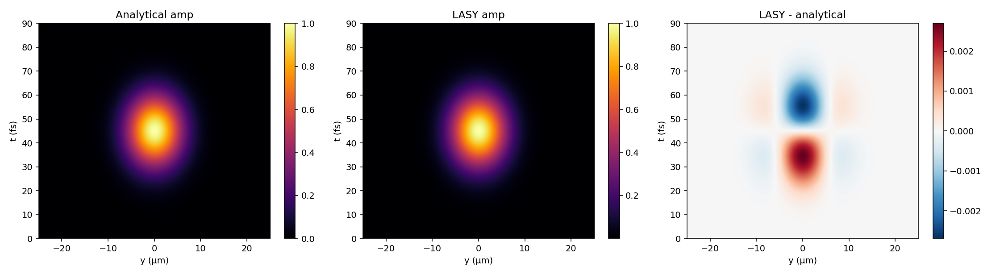

In [6]:
show(T2_FIG, 'input_amplitude.png')

**Phase:** LASY phase (after carrier-offset fix) vs the analytical deck formula.
Note the different scales: the deck phase spans [0, 1.5] rad (parabolic
wavefront curvature), while the LASY phase spans [−126, 0] rad (it includes
the accumulated propagation phase over ~10 µm). Therefore the difference between the first two figures is meaningless. The third figure is the key here -- the *difference in the beam
core* (right panel) is ~0.004 rad — essentially negligible. 

The carrier-offset (piston) fix is critical here: without it, the LASY
propagator's arbitrary global phase constant (~π) would cause a ~137% error.

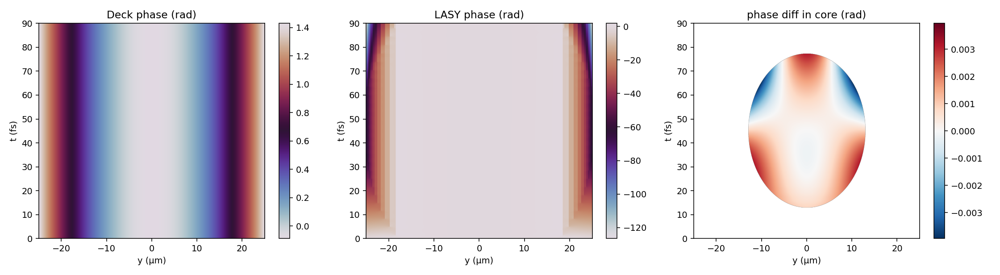

In [7]:
show(T2_FIG, 'input_phase.png')

### 2×2 bar chart — error attribution

The key result. Each bar shows the max relative difference (vs the `numerical`
reference) for one cell of the 2×2. The dashed line is the quadrature
prediction √(amp² + phase²). The green bar (LASY amplitude + LASY phase against full numerical) doesn't exactly touch the quadrature prediction line. This isn't unreasonable as the bars show the maximum error and the maximum errors in phase and amplitude don't have to be at the same spacetime point (so the quadrature formula is not accurate). 

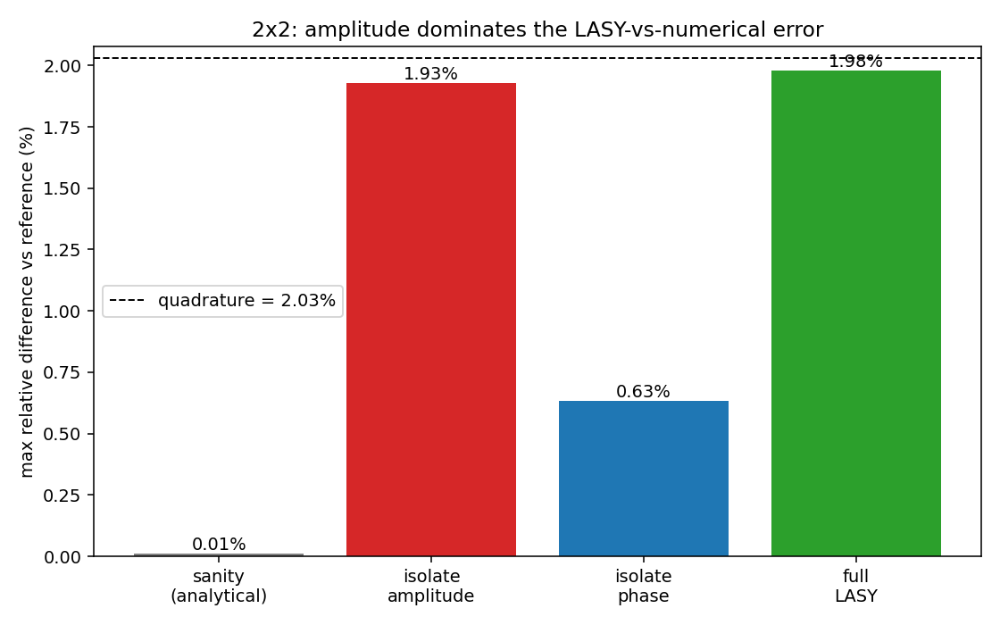

In [8]:
show(T2_FIG, 'bar_2x2.png')

### 2×2 metrics table

In [9]:
df2 = pd.read_csv(os.path.join(BASE, 'test2_lasy_2x2', 'metrics_2x2.csv'))
df2

,case,max_abs_a0,max_abs_pct_peak,max_rel_pct,mean_rel_pct
0,analytical built-in (sanity),0.000752,0.0009,0.0121,0.0015
1,LASY amp + deck phase (isolate amplitude),0.229790,0.2697,1.9297,0.3225
2,num amp + LASY phase (isolate phase),0.032725,0.0384,0.6344,0.0598
3,LASY amp + LASY phase (full LASY),0.231460,0.2717,1.9777,0.3195


| Cell | Max rel. diff | Interpretation |
|------|--------------|----------------|
| Sanity (analytical) | 0.012% | Reference is trustworthy |
| Isolate amplitude | **1.93%** | Dominant error source |
| Isolate phase | **0.63%** | Small contribution |
| Full LASY | **1.98%** | ≈ quadrature (2.03%) |

**Amplitude share of error variance:** 1.93² / (1.93² + 0.63²) = **90.2%**.

The errors add in quadrature, confirming the amplitude and phase contributions
are **independent**. The residual ~2% amplitude difference is the physical gap
between LASY's angular-spectrum propagation and the paraxial Gaussian — it is
*not* a bug in the injection pipeline. For tightly focused or aberrated beams,
LASY would be the *more* accurate source.

Compared to the laptop runs (isolate-phase was 0.49%), the higher resolution
here (40 cells/λ vs ~20) resolves more of the beam edge, slightly increasing
the phase contribution. The qualitative picture is unchanged.

### Field triptychs — numerical (reference) vs full LASY

The full-LASY run compared against the numerical reference. The difference
panel shows the ~0.2 a₀ residual (vs ~85 a₀ peak) concentrated at the beam
edges, modulated by the carrier frequency.

**Snapshot t00**

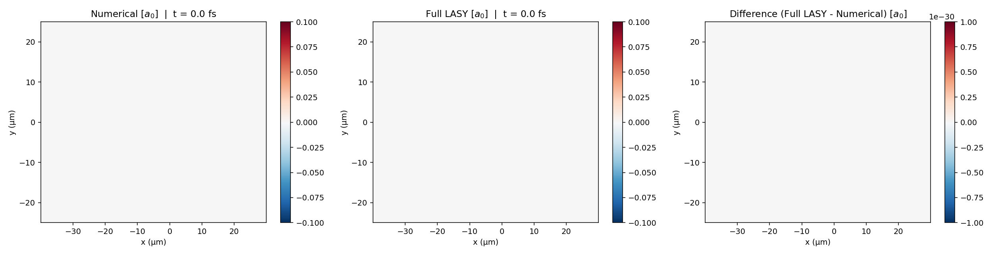

**Snapshot t06**

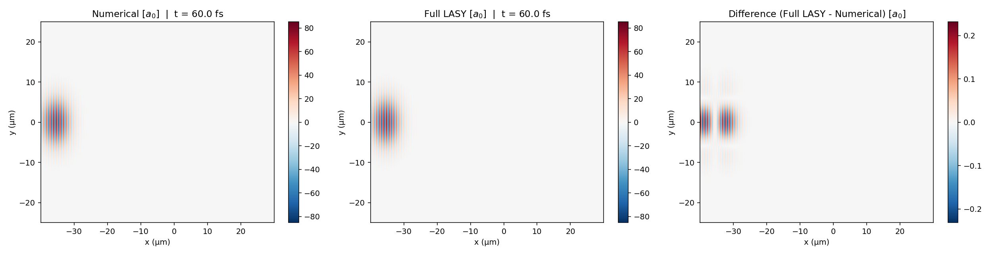

**Snapshot t13**

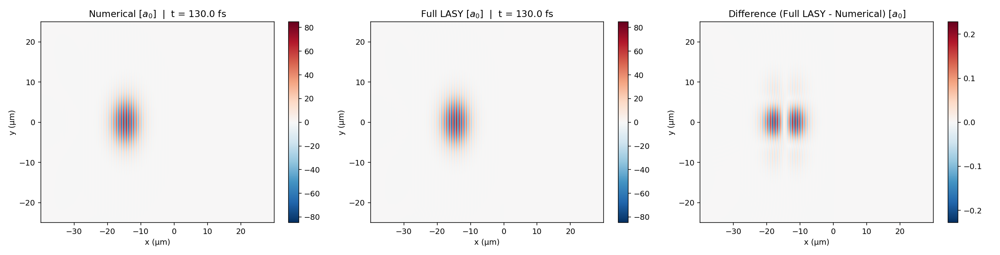

**Snapshot t19**

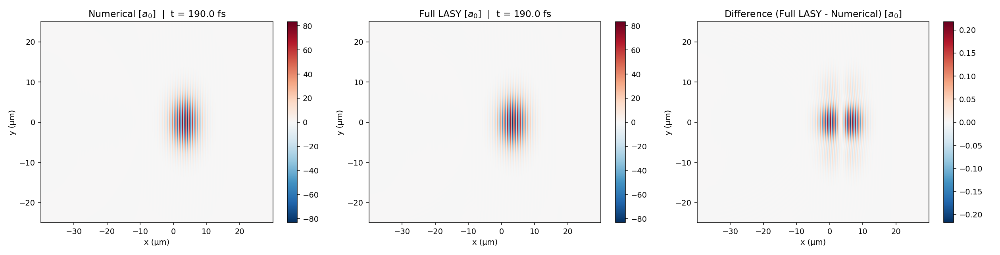

**Snapshot t25**

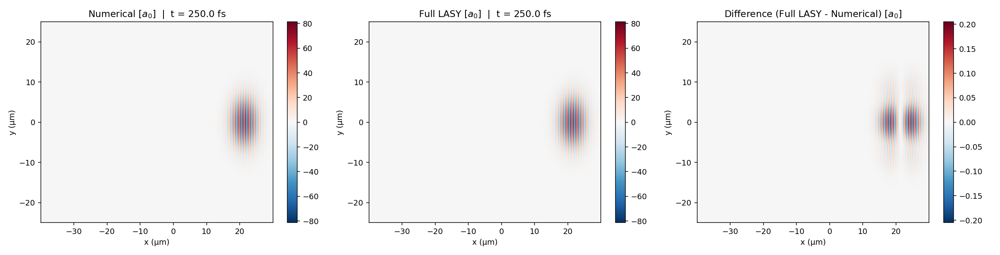

In [10]:
for idx in ['00', '06', '13', '19', '25']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T2_FIG, f'field_t{idx}.png')

### Relative difference maps

**Snapshot t06**

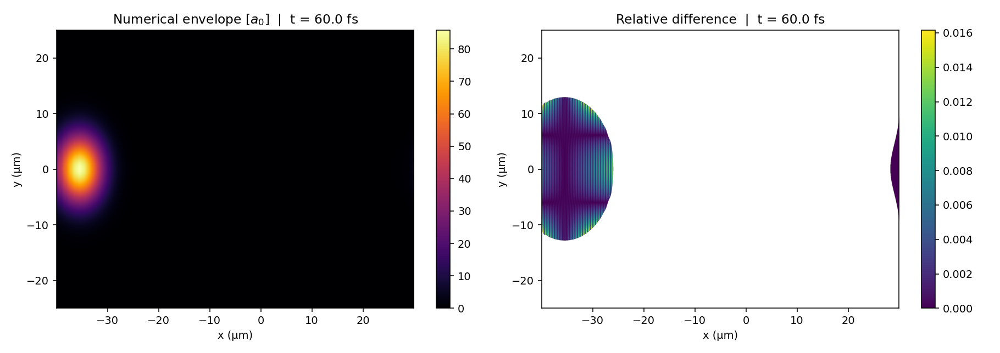

**Snapshot t13**

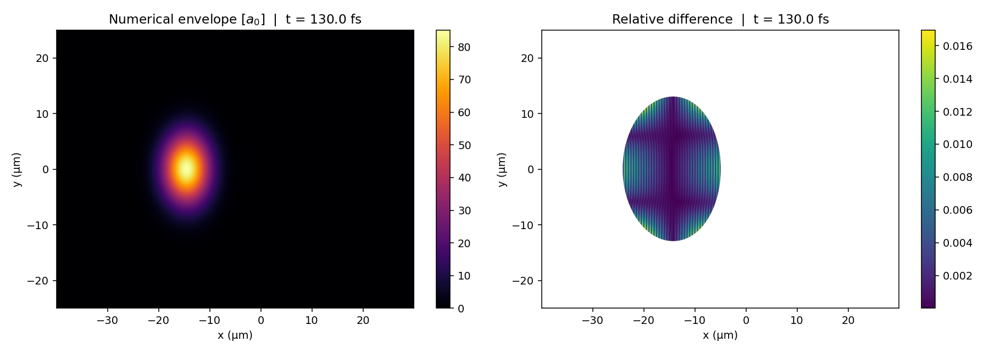

**Snapshot t19**

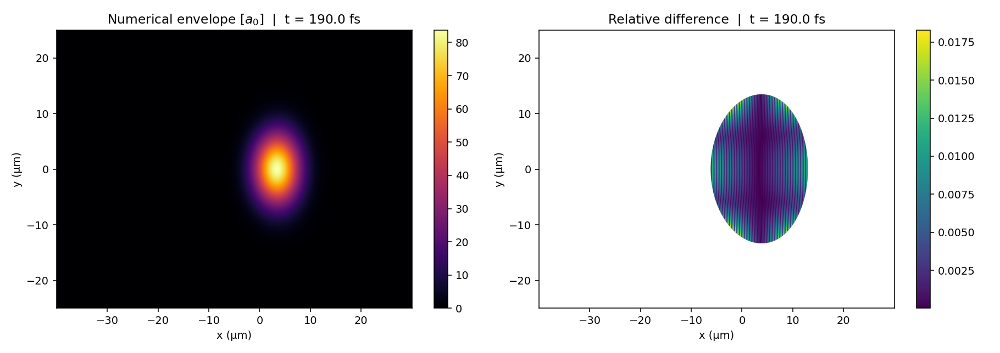

**Snapshot t25**

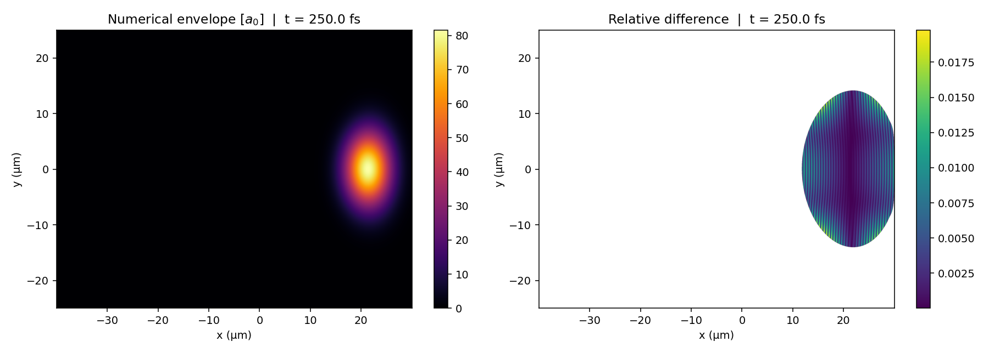

In [20]:
for idx in [ '06', '13', '19', '25']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T2_FIG, f'reldiff_t{idx}.png')

### On-axis line-outs (y = 0)

**Snapshot t00**

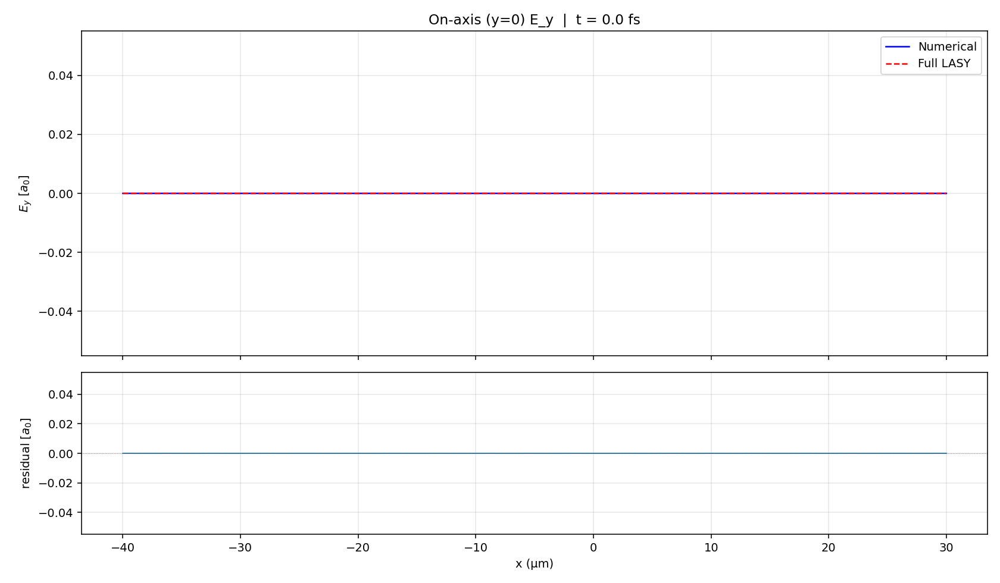

**Snapshot t06**

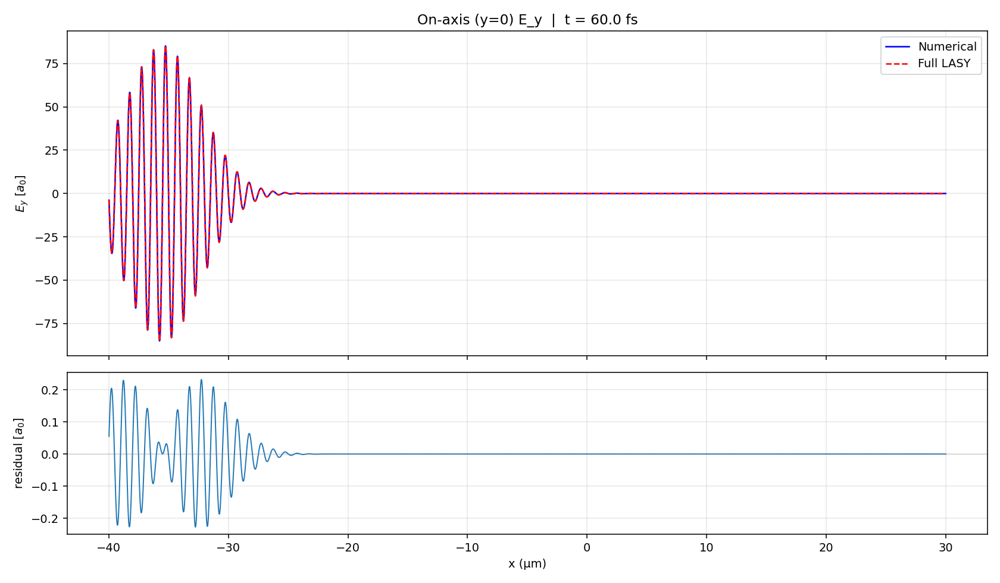

**Snapshot t13**

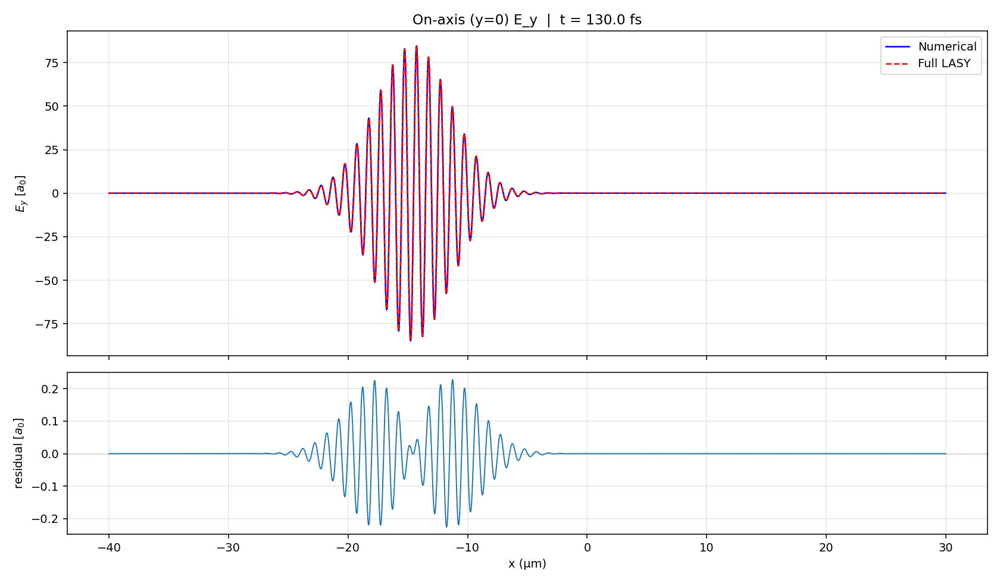

**Snapshot t19**

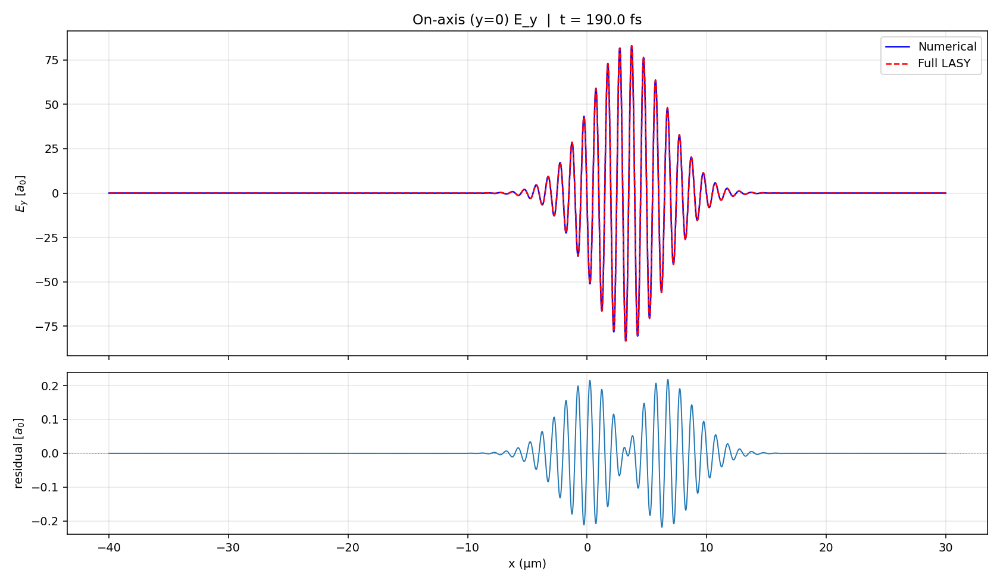

**Snapshot t25**

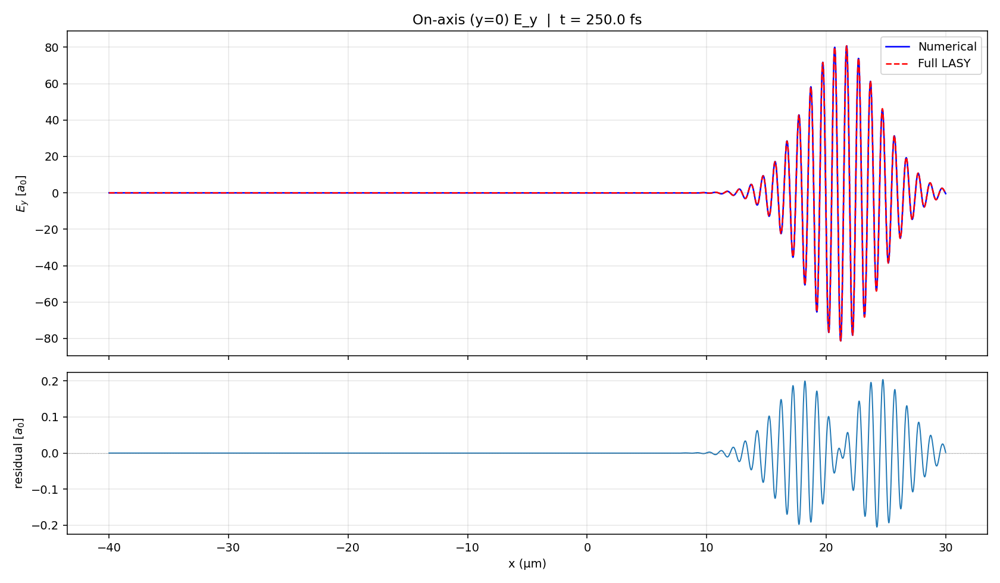

In [12]:
for idx in ['00', '06', '13', '19', '25']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T2_FIG, f'lineout_y0_t{idx}.png')

**Test 2 conclusion:** the phase-from-file feature is validated. The 2×2
experiment cleanly separates the amplitude and phase contributions, proving
they are independent (quadrature sum matches the combined error). Amplitude
dominates at ~90% of variance; the residual is physical (angular-spectrum vs
paraxial), not a pipeline artefact.

---
## Test 3 — 3D Gaussian beam, profile-only comparison

**What:** the 3D counterpart of Test 1. The analytical run uses EPOCH's native
`gauss(y,0,w0) * gauss(z,0,w0)` separable profile; the numerical run injects
the same Gaussian from a 2D (y,z) spatial `.dat` file. Both use `phase = 0`
and an analytical temporal envelope (`t_profile`), so this isolates the 3D
spatial injection path.

**Beam:** λ₀ = 1 µm, w₀ = 3 µm, I = 10²⁰ W/cm².  
**Resolution:** 30 cells/λ (nx = 300, ny = nz = 480).  
**Box:** x ∈ [−5, 5] µm, y,z ∈ [−8, 8] µm, t_end = 50 fs.

### Headline metrics

| Metric | Value |
|--------|-------|
| Peak \|E_y\| | 8.48 a₀ |
| Full-3D max \|difference\| | 2.33 × 10⁻⁴ a₀ (0.0027% of peak) |
| z = 0 max relative difference | **0.0095%** |
| z = 0 mean relative difference | 0.0015% |

### z = 0 mid-plane field triptychs

The z = 0 slice is the direct 2D analogue of Test 1. The difference panel
(right) shows residuals at the ~2 × 10⁻⁴ a₀ level — tiny compared to the
field amplitude.

**Snapshot t01**

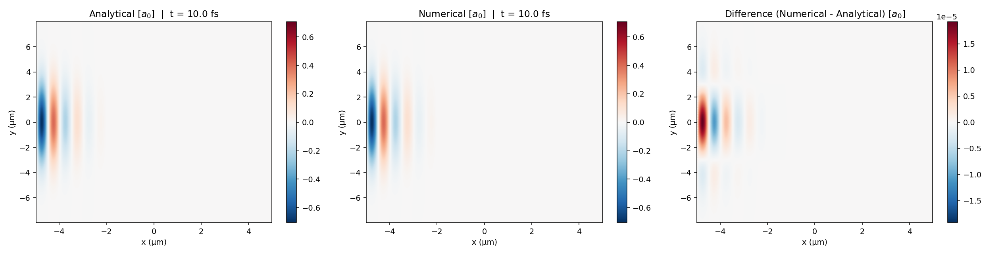

**Snapshot t03**

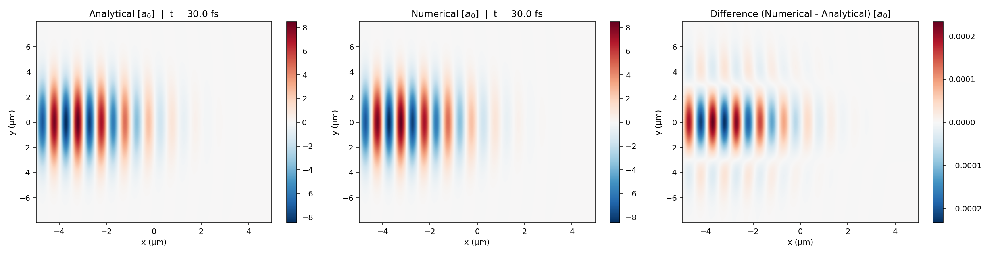

**Snapshot t04**

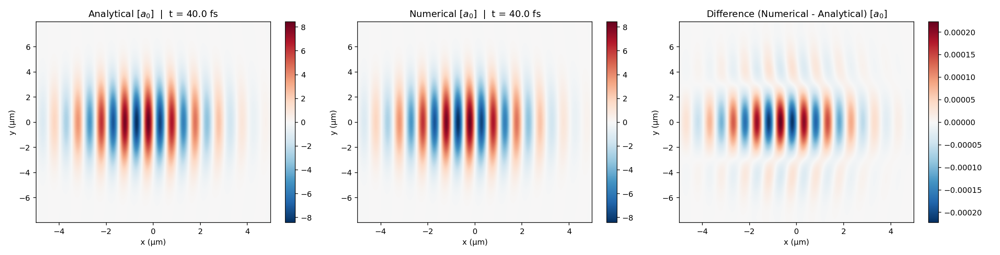

**Snapshot t05**

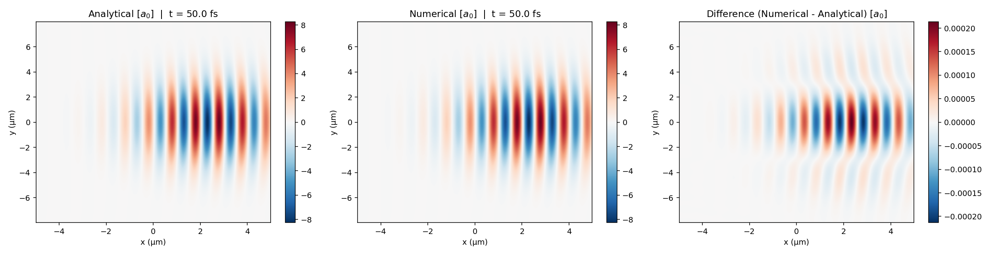

In [21]:
for idx in [ '01', '03', '04', '05']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T3_FIG, f'field_z0_t{idx}.png')

### z = 0 relative difference maps

**Snapshot t01**

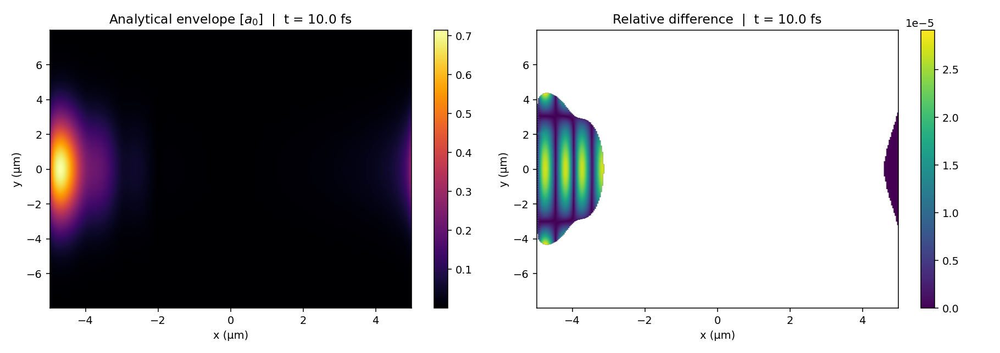

**Snapshot t03**

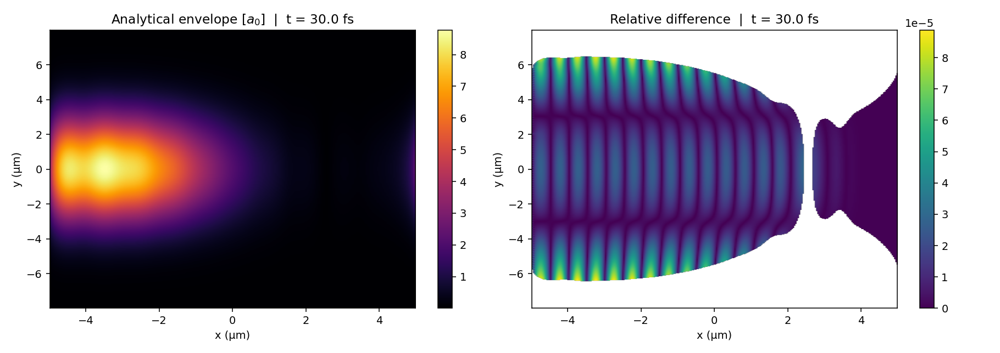

**Snapshot t04**

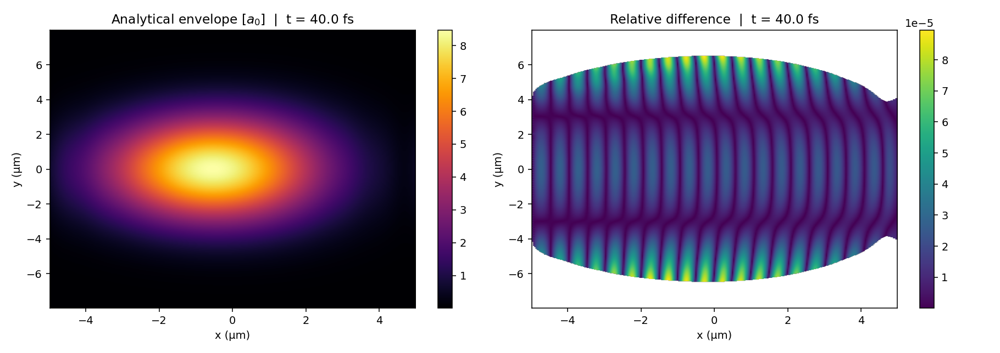

**Snapshot t05**

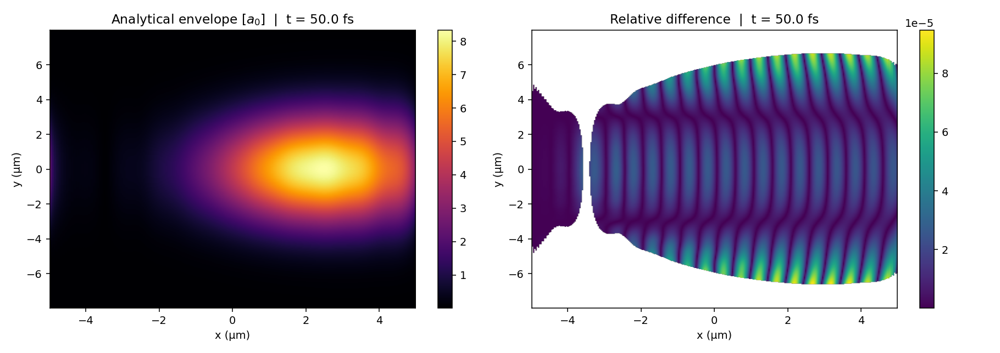

In [22]:
for idx in [ '01', '03', '04', '05']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T3_FIG, f'reldiff_z0_t{idx}.png')

### On-axis line-outs (y = z = 0)

E_y along the propagation axis at the beam centre. As in Test 1, the
analytical and numerical curves overlay almost perfectly.

**Snapshot t00**

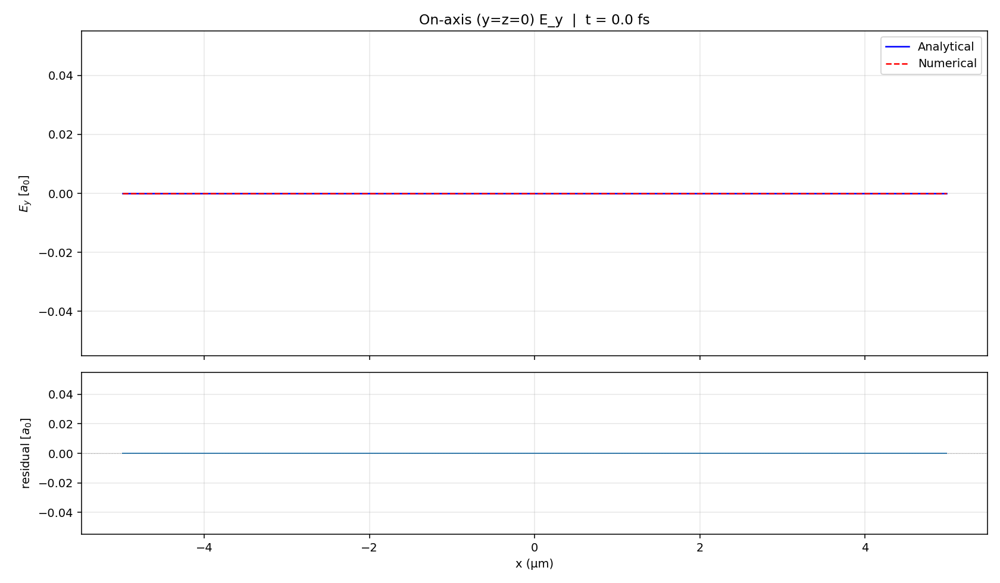

**Snapshot t01**

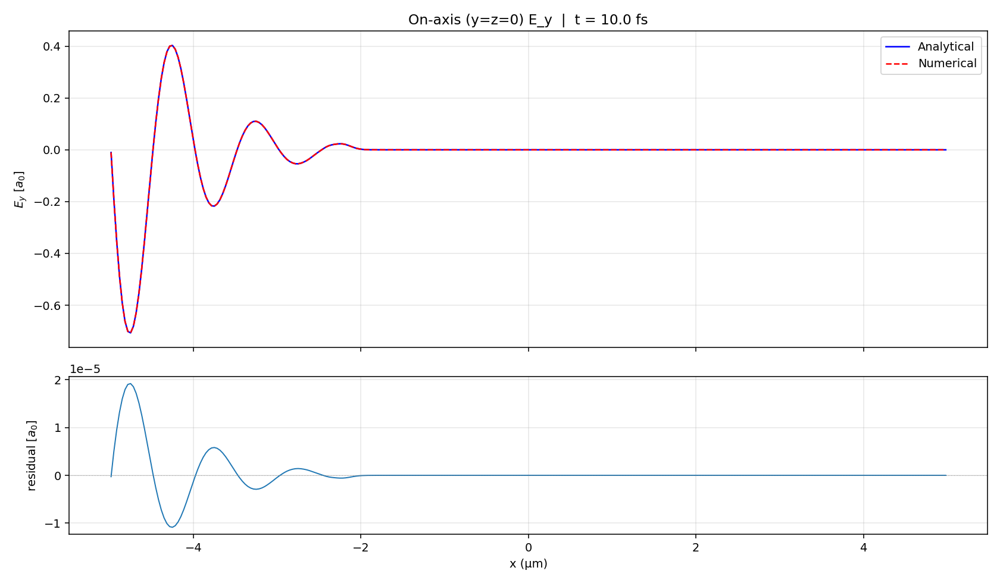

**Snapshot t03**

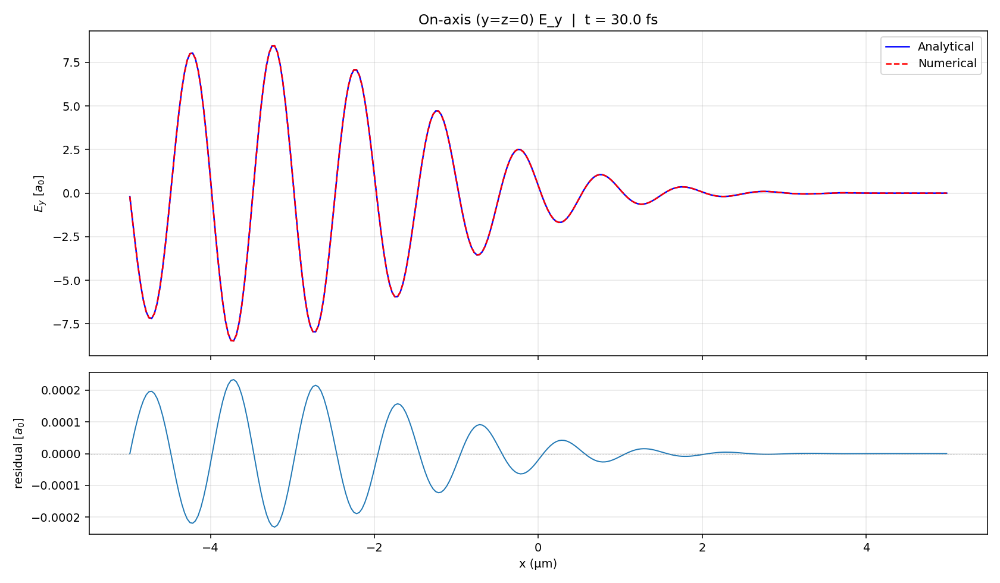

**Snapshot t04**

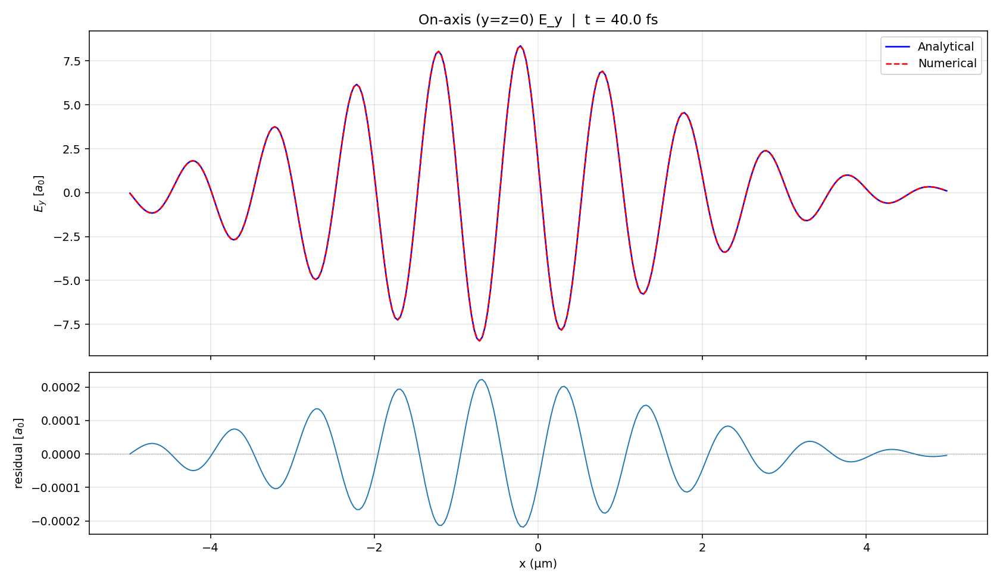

**Snapshot t05**

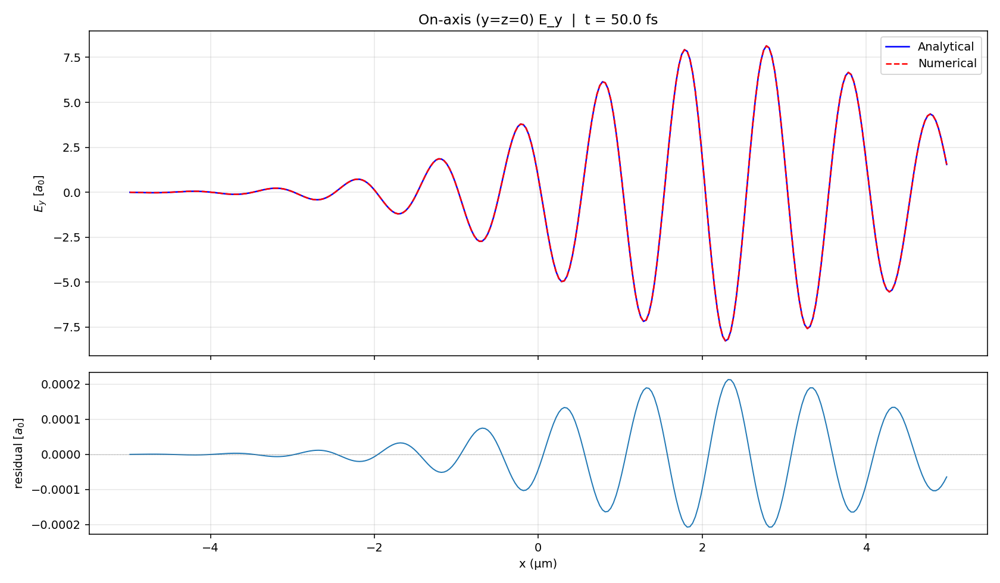

In [15]:
for idx in ['00', '01', '03', '04', '05']:
    display(Markdown(f'**Snapshot t{idx}**'))
    show(T3_FIG, f'lineout_axis_t{idx}.png')

### z-slice montage

Analytical field (top row) and difference (bottom row) at several z-planes,
at a fixed time (t ≈ 30 fs, mid-simulation). This shows the 3D injector
captures the beam's Gaussian z-structure — the difference stays small and
spatially uniform across all z-slices.

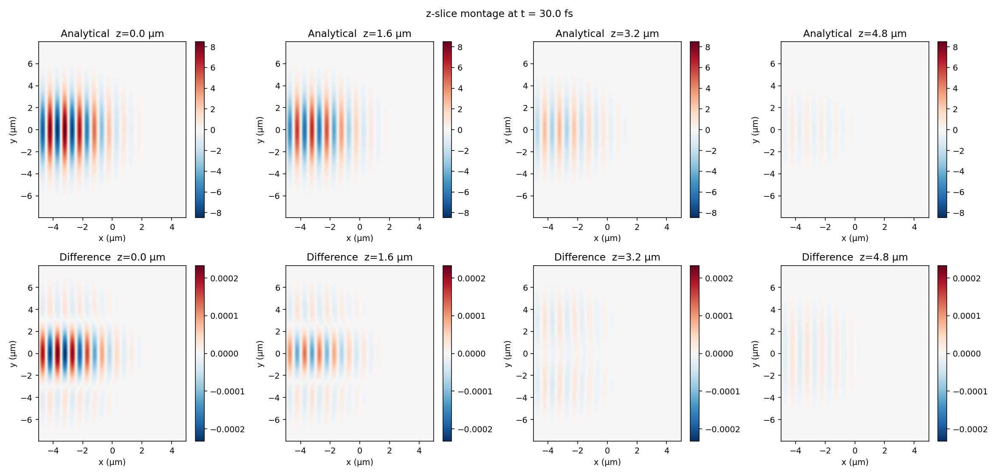

In [16]:
show(T3_FIG, 'zmontage.png')

### Per-snapshot metrics

In [17]:
df3 = pd.read_csv(os.path.join(BASE, 'test3_gaussian_3d', 'metrics.csv'))
df3

,time_fs,max_abs_a0_z0,max_rel_pct_z0
0,0.03,0.000000,NaN
1,10.00,0.000019,0.01598
2,20.00,0.000166,0.00890
3,30.00,0.000233,0.00887
4,40.01,0.000223,0.00900
5,50.01,0.000213,0.00958


The max absolute difference is stable at ~2 × 10⁻⁴ a₀ across all snapshots
after the initial ramp-up. The relative difference stays below 0.01% — even
better than Test 1 (the wider w₀ = 3 µm beam has gentler gradients, so
interpolation is more accurate).

**Test 3 conclusion:** the 3D spatial `.dat` injector reproduces the native
separable Gaussian to < 0.01%. The z-montage confirms the beam's transverse
structure is captured across all z-planes.

---
## Summary

| Test | Max rel. diff | What it proves |
|------|--------------|----------------|
| 1 (2D profile-only) | **0.011%** | `.dat` amplitude injection is faithful to the discretisation floor |
| 2 (LASY 2×2) | **1.98%** (full), 1.93% amp, 0.63% phase | Amplitude dominates (~90%); errors are independent; residual is physical (angular-spectrum vs paraxial) |
| 3 (3D profile-only) | **0.0095%** | 3D spatial injection works; beam z-structure captured |

### Key takeaways

1. **The custom injector works.** Both the 2D spatiotemporal and 3D spatial
   `.dat` injection paths reproduce EPOCH's native analytical Gaussian to
   < 0.02% — well below any physically relevant threshold.

2. **The phase-from-file feature works.** The LASY phase (after the
   carrier-offset fix) matches the analytical deck formula to ~0.004 rad in
   the beam core, contributing only 0.63% relative difference in the field.

3. **The ~2% LASY residual is physical, not a bug.** It reflects the genuine
   difference between LASY's angular-spectrum propagation and the paraxial
   analytical Gaussian. For tightly focused or aberrated beams (the eventual
   target), LASY would be the *more* accurate source — the paraxial formula
   would be the one that's wrong.

4. **Higher resolution confirms the laptop results.** The qualitative picture
   is unchanged at 40–50 cells/λ vs ~20 on the laptop. The phase contribution
   rose slightly (0.49% → 0.63%) as the finer grid resolves more of the beam
   edge — consistent with the error being a physical edge effect.

These results validate the full LASY → EPOCH injection pipeline (amplitude +
phase from file) 

With this test, I think the 2D EPOCH-mod is ready to use.